# Importing Libraries and loading data 

In [1]:
import numpy as np
import os
import matplotlib.pyplot as plt
import cv2
from PIL import Image 
import warnings
warnings.filterwarnings("ignore")

import keras
from keras.optimizers import Adam 
from keras.models import Sequential, Model
from keras.layers import Dense, LeakyReLU, BatchNormalization, Reshape, Flatten, Input
from keras.layers import Conv2D, MaxPooling2D, Activation, Dropout, Conv2DTranspose

Using TensorFlow backend.


# Getting images ready

In [20]:
#Resize images to 64x64 --> No need to run this 

"""
def resize_images(input_path ='', output_path = ''):
    dirs = os.listdir(input_path)

    for item in dirs:
        try:
            if os.path.isfile(input_path + item):
                im = Image.open(input_path + item)
                f,e = os.path.split(input_path + item)
                imResize = im.resize((64,64), Image.ANTIALIAS)
                imResize.save(output_path + e +" resized.jpg", "JPEG", quality = 90)
        except:
            pass
    
            
input_path = "E:/deep_learning/GAN/test_images/cropped/"
output_path = "E:/deep_learning/GAN/test_images/testing/"
resize_images(input_path = input_path  ,output_path =  output_path)
"""            
    

In [3]:
#Rename images --> No need to run this 

"""
input_path = "E:/deep_learning/GAN/test_images/cropped/"   
output_path = "E:/deep_learning/GAN/test_images/testing/"

for count, filename in enumerate(os.listdir(output_path)):
    dst = str(count+1)+".jpg"
    src = output_path + filename 
    dst = output_path + dst 
    
    os.rename(src, dst)
"""

# Load images 

In [2]:

def list_images(basePath, contains=None):
    # return the set of files that are valid
    return list_files(basePath, validExts=(".jpg", ".jpeg", ".png", ".bmp"), contains=contains)

#Get file path
def list_files(basePath, validExts = (".jpg", ".jpeg", ".png", ".bmp"), contains = None):
    #loop over the directory structure 
    for (rootDir, dirNames, filenames) in os.walk(basePath):
        #loop over the filenames in the current directory
        for filename in filenames:
            #if the contains string is not None and the filename does not contain the supplied string, the ignore the file
            if contains is not None and filename.find(contains) == -1:
                continue
                
            #determine the file extension of the current file
            ext = filename[filename.rfind("."):].lower()
        
            #check to see of the file is an image and should be processed
            if ext.endswith(validExts):
                #construct the path to the image and yield it
                imagePath = os.path.join(rootDir, filename).replace(" ", "\\ ")
            
                yield imagePath
        

#Load Images         
def load_images(directory ='', size = (64,64)):
    images = []
    labels = [] #Integers corresponding to the catergories in alphabetical order
    
    label = 0
    
    imagePaths = list(list_images(directory))
    
    for path in imagePaths:
        
        if not("OSX" in path):
            
            path = path.replace("\\", "/")
            
            image = cv2.imread(path) #Reading the image with OpenCV
            image = cv2.resize(image, size) #Resizing the image, in case some are not of the same size 
            
            images.append(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)) #Open CV default reading "BGR", not "RGB," convert BGR to RGB
            
    return images
  

In [3]:
#output_path --> The path that stores the training data (Anime faces)
output_path = "E:/deep_learning/GAN/test_images/testing/"
images = load_images(output_path)

In [4]:
len(images)

63569

# Look at some images 

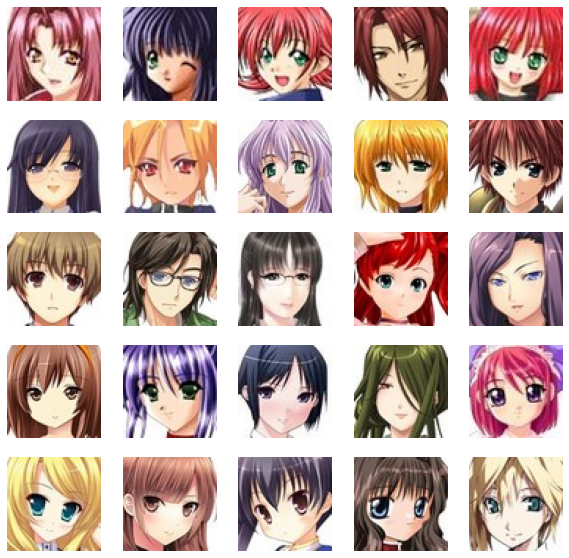

In [5]:
_,ax = plt.subplots(5,5, figsize = (10,10)) 
for i in range(5):
    for j in range(5):
        ax[i,j].imshow(images[5*i+j])
        ax[i,j].axis('off')

# Creating the GAN

In [6]:
class GAN():
    def __init__(self):
        #Set image shape 
        self.img_shape = (64, 64, 3)
        
        #Set initial noise vector for Generator 
        self.noise_size = 100
        
        #Adam as optimizer 
        optimizer = Adam(0.0002,0.5)
        
        #Complile the loss for Discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy', 
                                   optimizer=optimizer,
                                   metrics=['accuracy'])
        
        #Complile the loss for Generator
        self.generator = self.build_generator()
        self.generator.compile(loss='binary_crossentropy', optimizer=optimizer)
        
        self.combined = Sequential()
        self.combined.add(self.generator)
        self.combined.add(self.discriminator)
        
        #Freeze Disciminator to avoid changing of parameters after discriminator is trained 
        self.discriminator.trainable = False
        
        #Complile the loss for combined networks 
        self.combined.compile(loss='binary_crossentropy', optimizer=optimizer)
        
        self.combined.summary()
        
    # Creating the generator, the large kernels in the convolutional layers allow the network to create complex structures.
    def build_generator(self):
        epsilon = 0.00001 # Small float added to variance to avoid dividing by zero in the BatchNorm layers.
        noise_shape = (self.noise_size,)
        
        model = Sequential()
        
        model.add(Dense(4*4*512, activation='linear', input_shape=noise_shape))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Reshape((4, 4, 512)))
        
        model.add(Conv2DTranspose(512, kernel_size=[4,4], strides=[2,2], padding="same",
                                  kernel_initializer= keras.initializers.TruncatedNormal(stddev=0.02)))
        model.add(BatchNormalization(momentum=0.9, epsilon=epsilon))
        model.add(LeakyReLU(alpha=0.2))
        
        model.add(Conv2DTranspose(256, kernel_size=[4,4], strides=[2,2], padding="same",
                                  kernel_initializer= keras.initializers.TruncatedNormal(stddev=0.02)))
        model.add(BatchNormalization(momentum=0.9, epsilon=epsilon))
        model.add(LeakyReLU(alpha=0.2))
        
        model.add(Conv2DTranspose(128, kernel_size=[4,4], strides=[2,2], padding="same",
                                  kernel_initializer= keras.initializers.TruncatedNormal(stddev=0.02)))
        model.add(BatchNormalization(momentum=0.9, epsilon=epsilon))
        model.add(LeakyReLU(alpha=0.2))
        
        model.add(Conv2DTranspose(64, kernel_size=[4,4], strides=[2,2], padding="same",
                                  kernel_initializer= keras.initializers.TruncatedNormal(stddev=0.02)))
        model.add(BatchNormalization(momentum=0.9, epsilon=epsilon))
        model.add(LeakyReLU(alpha=0.2))
        
        model.add(Conv2DTranspose(3, kernel_size=[4,4], strides=[1,1], padding="same",
                                  kernel_initializer= keras.initializers.TruncatedNormal(stddev=0.02)))

        # Standard activation for the generator of a GAN
        model.add(Activation("tanh"))
        
        model.summary()

        noise = Input(shape=noise_shape)
        img = model(noise)

        return Model(noise, img)
    
    # Creating the Discriminator
    def build_discriminator(self):

        model = Sequential()

        model.add(Conv2D(128, (3,3), padding='same', input_shape=self.img_shape))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization())
        model.add(Conv2D(128, (3,3), padding='same'))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size=(3,3)))
        model.add(Dropout(0.2))

        model.add(Conv2D(128, (3,3), padding='same'))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization())
        model.add(Conv2D(128, (3,3), padding='same'))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size=(3,3)))
        model.add(Dropout(0.3))

        model.add(Flatten())
        model.add(Dense(128))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(128))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(1, activation='sigmoid'))
        
        model.summary()
        
        img = Input(shape=self.img_shape)
        validity = model(img)

        return Model(img, validity)
    
    #Training of model
    def train(self, epochs, batch_size=128, metrics_update=50, save_images=100, save_model=2000):

        X_train = np.array(images)
        X_train = (X_train.astype(np.float32) - 127.5) / 127.5

        half_batch = int(batch_size / 2)
        
        mean_d_loss=[0,0]
        mean_g_loss=0

        for epoch in range(epochs):
            idx = np.random.randint(0, X_train.shape[0], half_batch)
            imgs = X_train[idx]

            noise = np.random.normal(0, 1, (half_batch, self.noise_size))
            gen_imgs = self.generator.predict(noise)

            # Training the discriminator
            
            # The loss of the discriminator is the mean of the losses while training on authentic and fake images
            d_loss = 0.5 * np.add(self.discriminator.train_on_batch(imgs, np.ones((half_batch, 1))),
                                  self.discriminator.train_on_batch(gen_imgs, np.zeros((half_batch, 1))))

            # Training the generator
            noise = np.random.normal(0, 1, (batch_size, self.noise_size))

            valid_y = np.array([1] * batch_size)
            g_loss = self.combined.train_on_batch(noise, valid_y)
            
            mean_d_loss[0] += d_loss[0]
            mean_d_loss[1] += d_loss[1]
            mean_g_loss += g_loss
            
            # We print the losses and accuracy of the networks every 200 batches mainly to make sure the accuracy of the discriminator
            # is not stable at around 50% or 100% (which would mean the discriminator performs not well enough or too well)
            if epoch % metrics_update == 0:
                print ("%d [Discriminator loss: %f, acc.: %.2f%%] [Generator loss: %f]" % (epoch, mean_d_loss[0]/metrics_update, 100*mean_d_loss[1]/metrics_update, mean_g_loss/metrics_update))
                mean_d_loss=[0,0]
                mean_g_loss=0
            
            # Saving 25 images
            if epoch % save_images == 0:
                self.save_images(epoch)
                self.save_one_images(epoch)
            
            # We save the architecture of the model, the weights and the state of the optimizer
            # This way we can restart the training exactly where we stopped
            if epoch % save_model == 0:
                self.generator.save("E:\\deep_learning\\GAN\\generator_%d" % epoch)
                self.discriminator.save("E:\\deep_learning\\GAN\\discriminator_%d" % epoch)

    # Saving 25 generated images to have a representation of the spectrum of images created by the generator
    def save_images(self, epoch):
        noise = np.random.normal(0, 1, (25, self.noise_size))
        gen_imgs = self.generator.predict(noise)
        
        # Rescale from [-1,1] into [0,1]
        gen_imgs = 0.5 * gen_imgs + 0.5

        fig, axs = plt.subplots(5,5, figsize = (8,8))

        for i in range(5):
            for j in range(5):
                axs[i,j].imshow(gen_imgs[5*i+j])
                axs[i,j].axis('off')

        plt.show()
        
        fig.savefig("E:\\deep_learning\\GAN\\Faces_%d.png" % epoch)
        plt.close()
        
        
    # Saving 1 generated images to have a representation of the spectrum of images created by the generator   
    def save_one_images(self, epoch):
        noise = np.random.normal(0, 1, (25, self.noise_size))
        gen_imgs = self.generator.predict(noise)
        
        # Rescale from [-1,1] into [0,1]
        gen_imgs = 0.5 * gen_imgs + 0.5

        fig, axs = plt.subplots(1,1, figsize = (8,8), squeeze = False)

        for i in range(1):
            for j in range(1):
                axs[i,j].imshow(gen_imgs[5*i+j])
                axs[i,j].axis('off')

        plt.show()
        
        fig.savefig("E:\\deep_learning\\GAN\\one_face_%d.png" % epoch)
        plt.close()








Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 64, 64, 128)       3584      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 64, 64, 128)       0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 64, 64, 128)       512       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 64, 64, 128)       147584    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 64, 64, 128)       0         
_________________________________________________________________
batch_normalization_2 (Batch (None, 64, 64, 128)       512       
____________________

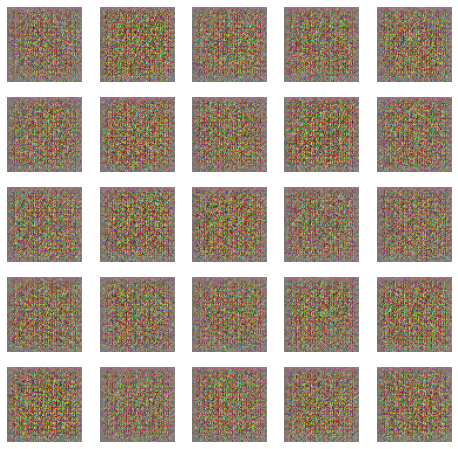

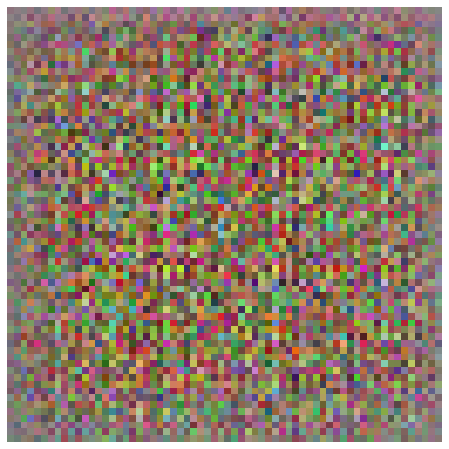

200 [Discriminator loss: 0.350161, acc.: 86.17%] [Generator loss: 3.456565]
400 [Discriminator loss: 0.312278, acc.: 89.14%] [Generator loss: 2.729079]
600 [Discriminator loss: 0.325849, acc.: 86.70%] [Generator loss: 3.416453]
800 [Discriminator loss: 0.284801, acc.: 89.08%] [Generator loss: 4.131595]
1000 [Discriminator loss: 0.278708, acc.: 88.58%] [Generator loss: 4.605845]


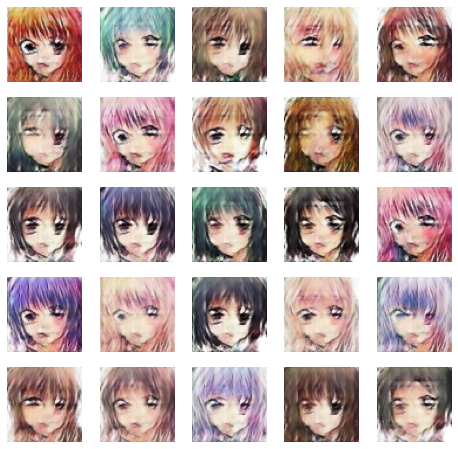

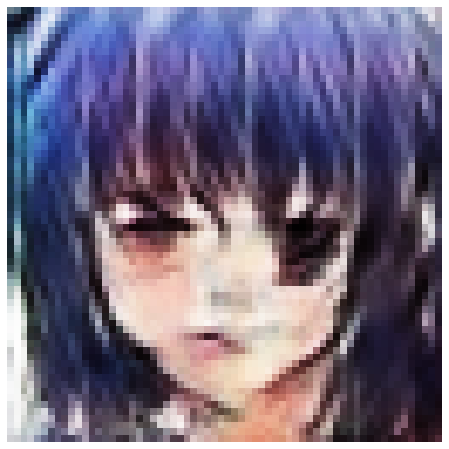

1200 [Discriminator loss: 0.279807, acc.: 88.98%] [Generator loss: 4.572239]
1400 [Discriminator loss: 0.310877, acc.: 88.07%] [Generator loss: 4.328785]
1600 [Discriminator loss: 0.325325, acc.: 88.15%] [Generator loss: 4.125735]
1800 [Discriminator loss: 0.271752, acc.: 89.72%] [Generator loss: 4.202505]
2000 [Discriminator loss: 0.312072, acc.: 88.89%] [Generator loss: 3.847745]


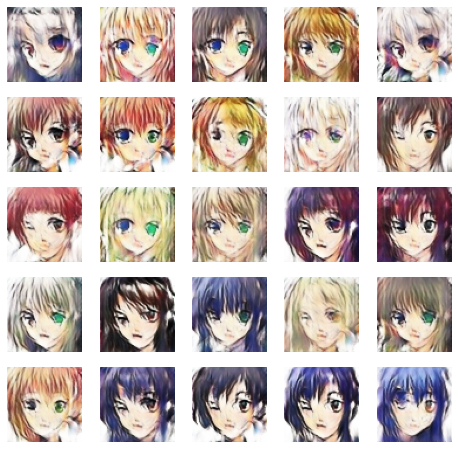

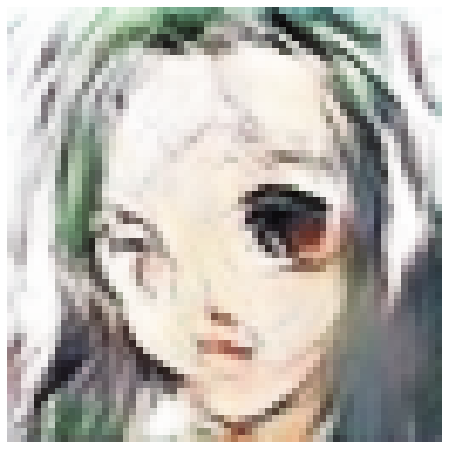

2200 [Discriminator loss: 0.268618, acc.: 89.86%] [Generator loss: 4.130602]
2400 [Discriminator loss: 0.268303, acc.: 89.79%] [Generator loss: 4.327101]
2600 [Discriminator loss: 0.294084, acc.: 88.92%] [Generator loss: 3.952820]
2800 [Discriminator loss: 0.300818, acc.: 88.18%] [Generator loss: 3.842291]
3000 [Discriminator loss: 0.398113, acc.: 83.79%] [Generator loss: 3.419267]


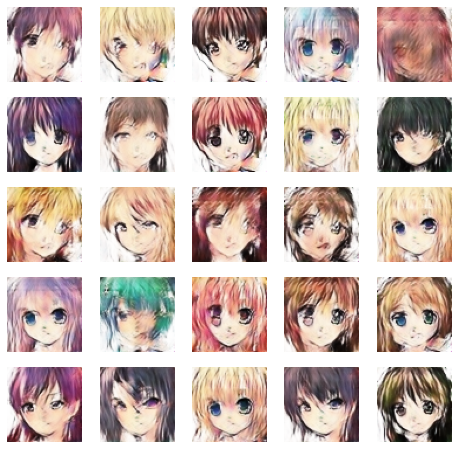

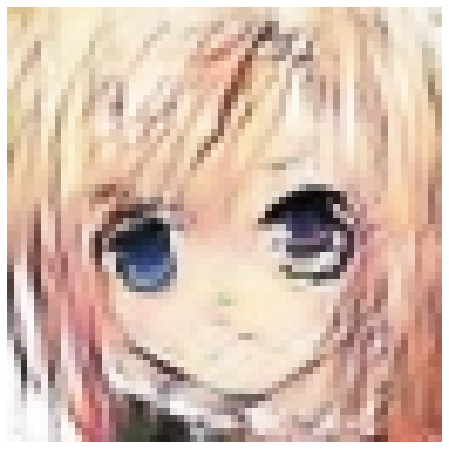

3200 [Discriminator loss: 0.283853, acc.: 89.34%] [Generator loss: 3.713037]
3400 [Discriminator loss: 0.308227, acc.: 87.87%] [Generator loss: 3.604179]
3600 [Discriminator loss: 0.242917, acc.: 90.99%] [Generator loss: 3.925876]
3800 [Discriminator loss: 0.354598, acc.: 85.91%] [Generator loss: 3.444443]
4000 [Discriminator loss: 0.245266, acc.: 91.17%] [Generator loss: 3.779185]


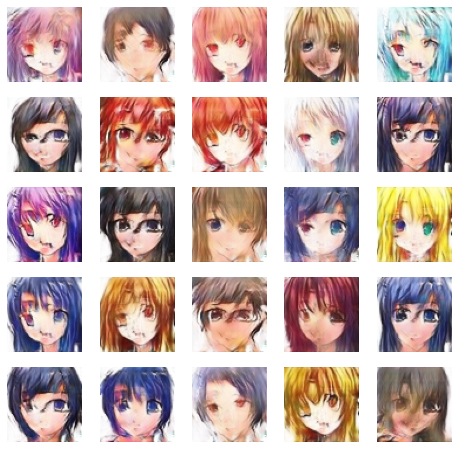

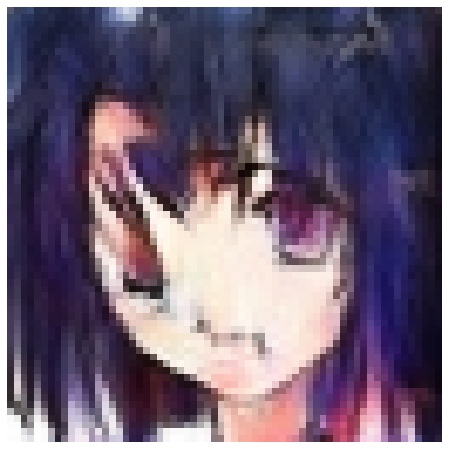

4200 [Discriminator loss: 0.348530, acc.: 85.55%] [Generator loss: 3.199962]
4400 [Discriminator loss: 0.333764, acc.: 86.93%] [Generator loss: 3.323803]
4600 [Discriminator loss: 0.205859, acc.: 92.51%] [Generator loss: 4.167259]
4800 [Discriminator loss: 0.206833, acc.: 92.94%] [Generator loss: 3.997236]
5000 [Discriminator loss: 0.239254, acc.: 91.40%] [Generator loss: 3.930496]


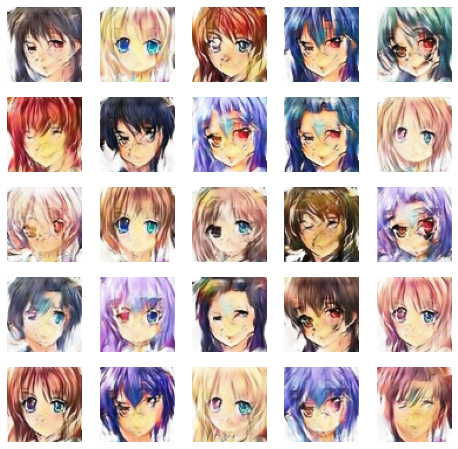

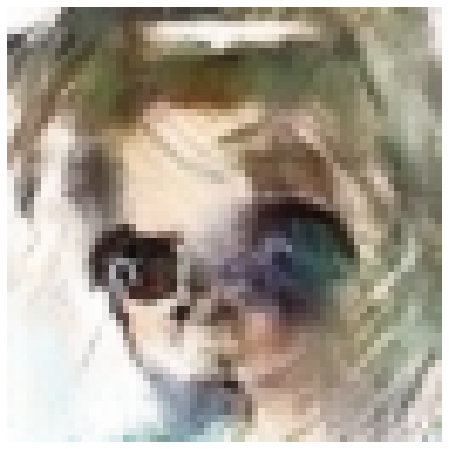

5200 [Discriminator loss: 0.257614, acc.: 90.88%] [Generator loss: 3.724002]
5400 [Discriminator loss: 0.225274, acc.: 92.54%] [Generator loss: 3.768312]
5600 [Discriminator loss: 0.242599, acc.: 91.10%] [Generator loss: 3.746625]
5800 [Discriminator loss: 0.241691, acc.: 91.56%] [Generator loss: 3.856423]
6000 [Discriminator loss: 0.269206, acc.: 90.21%] [Generator loss: 3.528596]


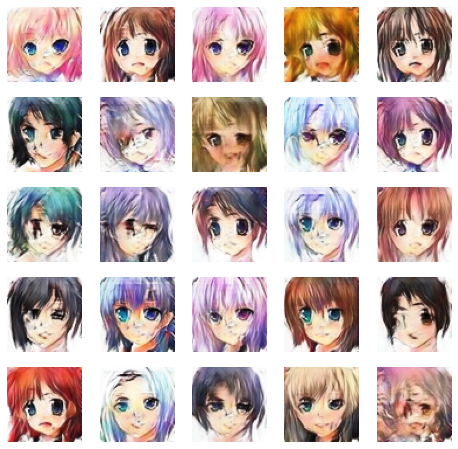

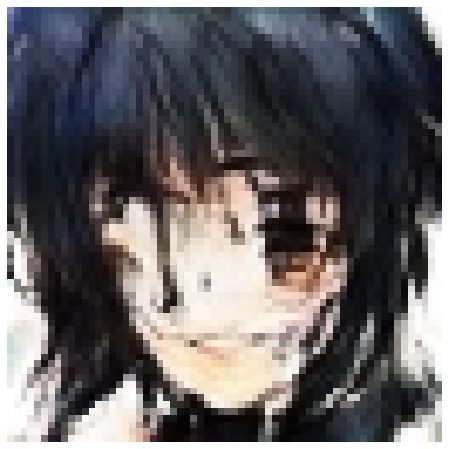

6200 [Discriminator loss: 0.282061, acc.: 88.14%] [Generator loss: 3.663477]
6400 [Discriminator loss: 0.273478, acc.: 89.35%] [Generator loss: 3.695392]
6600 [Discriminator loss: 0.286129, acc.: 89.69%] [Generator loss: 3.396979]
6800 [Discriminator loss: 0.277490, acc.: 89.36%] [Generator loss: 3.482566]
7000 [Discriminator loss: 0.278941, acc.: 90.28%] [Generator loss: 3.643095]


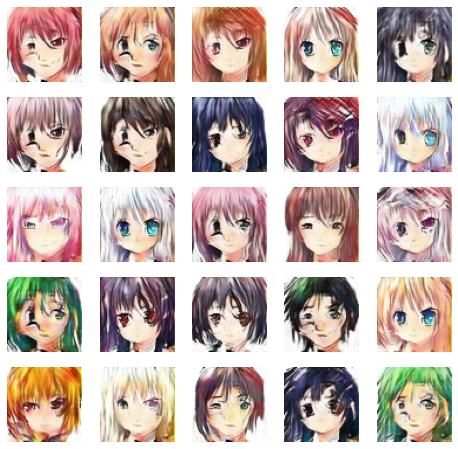

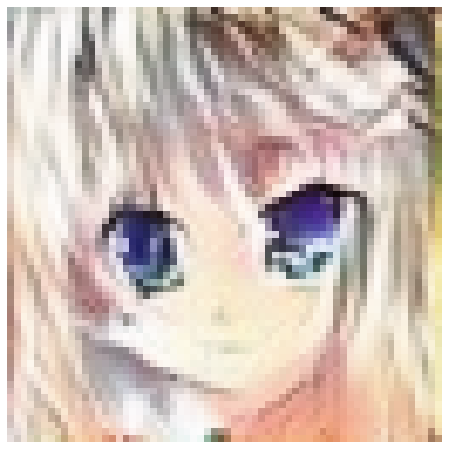

7200 [Discriminator loss: 0.320586, acc.: 86.03%] [Generator loss: 3.122993]
7400 [Discriminator loss: 0.244740, acc.: 91.05%] [Generator loss: 3.469608]
7600 [Discriminator loss: 0.326284, acc.: 86.36%] [Generator loss: 3.133653]
7800 [Discriminator loss: 0.298295, acc.: 89.27%] [Generator loss: 3.384629]
8000 [Discriminator loss: 0.192993, acc.: 93.04%] [Generator loss: 3.960506]


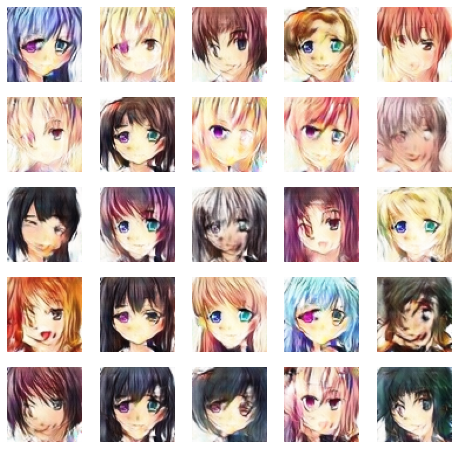

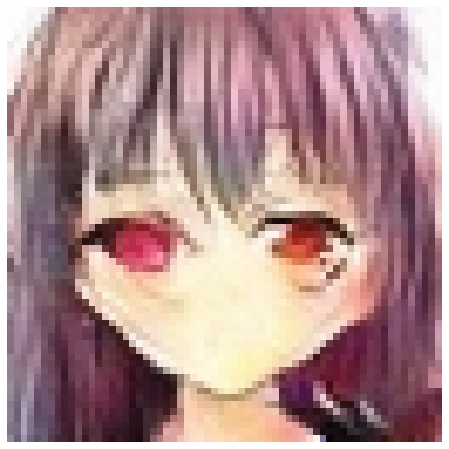

8200 [Discriminator loss: 0.156168, acc.: 94.68%] [Generator loss: 4.230666]
8400 [Discriminator loss: 0.270606, acc.: 89.27%] [Generator loss: 3.617833]
8600 [Discriminator loss: 0.347230, acc.: 85.94%] [Generator loss: 3.200870]
8800 [Discriminator loss: 0.221807, acc.: 92.36%] [Generator loss: 3.758261]
9000 [Discriminator loss: 0.247504, acc.: 90.62%] [Generator loss: 3.408406]


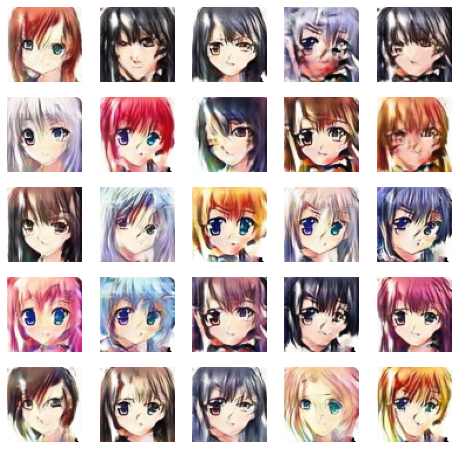

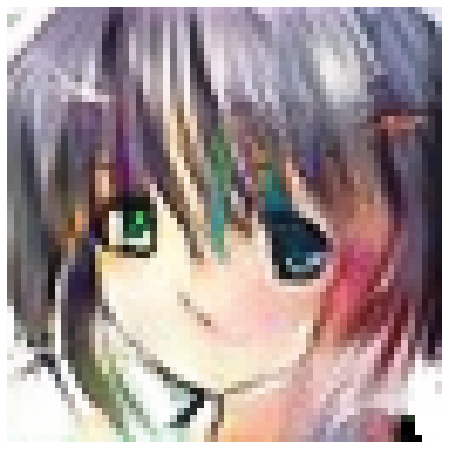

9200 [Discriminator loss: 0.210313, acc.: 92.72%] [Generator loss: 4.005373]
9400 [Discriminator loss: 0.240403, acc.: 91.58%] [Generator loss: 3.451315]
9600 [Discriminator loss: 0.219694, acc.: 91.98%] [Generator loss: 3.665001]
9800 [Discriminator loss: 0.270668, acc.: 89.65%] [Generator loss: 3.497304]
10000 [Discriminator loss: 0.261904, acc.: 89.56%] [Generator loss: 3.389618]


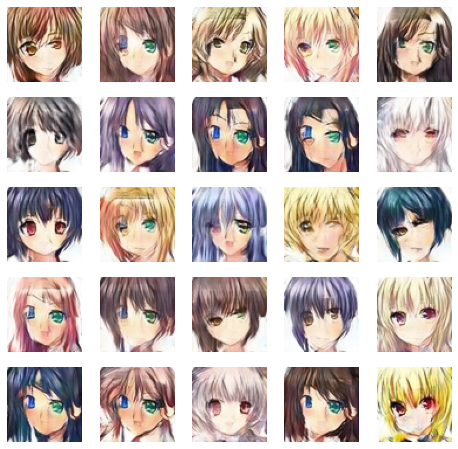

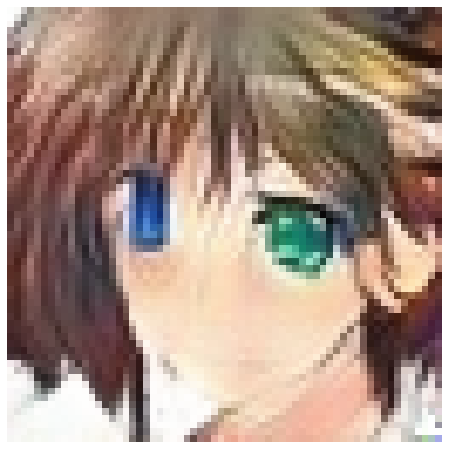

10200 [Discriminator loss: 0.190204, acc.: 93.64%] [Generator loss: 4.015167]
10400 [Discriminator loss: 0.361297, acc.: 83.87%] [Generator loss: 3.032739]
10600 [Discriminator loss: 0.328276, acc.: 88.09%] [Generator loss: 3.397370]
10800 [Discriminator loss: 0.202010, acc.: 92.68%] [Generator loss: 3.788243]
11000 [Discriminator loss: 0.149725, acc.: 94.68%] [Generator loss: 4.595598]


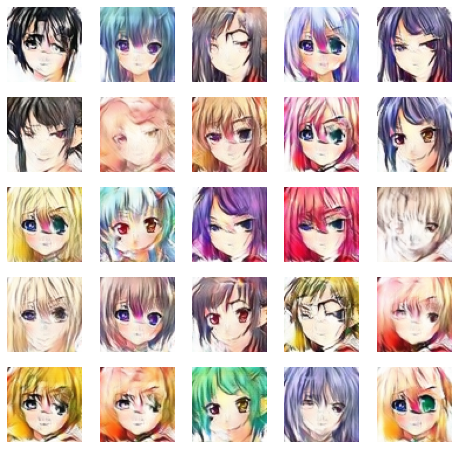

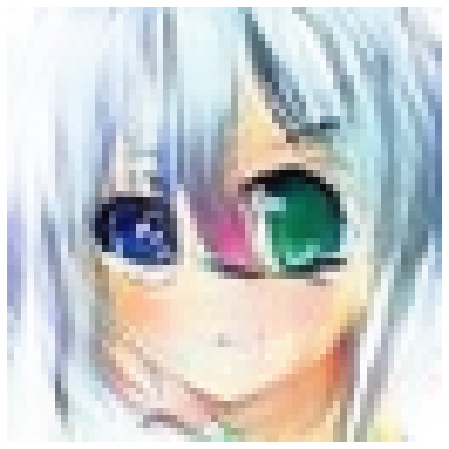

11200 [Discriminator loss: 0.192983, acc.: 93.55%] [Generator loss: 4.085188]
11400 [Discriminator loss: 0.218368, acc.: 92.41%] [Generator loss: 3.881936]
11600 [Discriminator loss: 0.230638, acc.: 91.72%] [Generator loss: 3.523828]
11800 [Discriminator loss: 0.322542, acc.: 86.14%] [Generator loss: 3.251396]
12000 [Discriminator loss: 0.195758, acc.: 93.30%] [Generator loss: 3.698013]


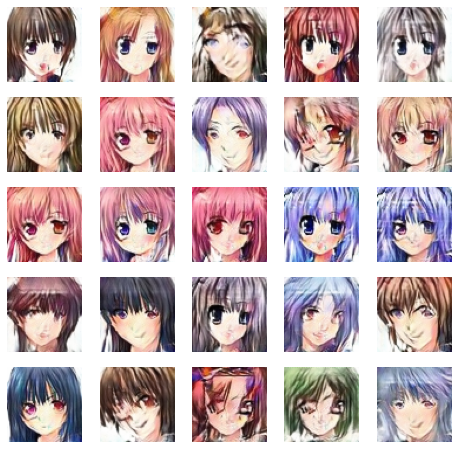

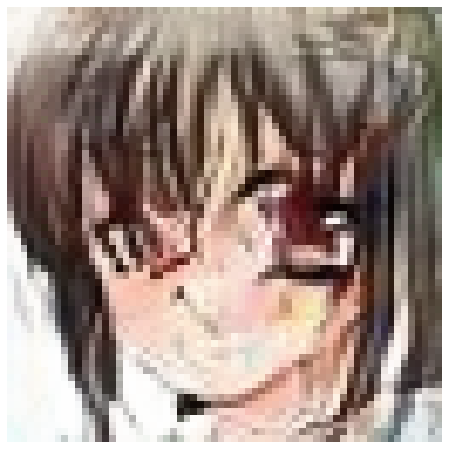

12200 [Discriminator loss: 0.212214, acc.: 92.78%] [Generator loss: 3.655902]
12400 [Discriminator loss: 0.195854, acc.: 92.97%] [Generator loss: 3.870424]
12600 [Discriminator loss: 0.288441, acc.: 87.51%] [Generator loss: 3.584111]
12800 [Discriminator loss: 0.161194, acc.: 94.39%] [Generator loss: 3.782791]
13000 [Discriminator loss: 0.283033, acc.: 88.14%] [Generator loss: 3.634520]


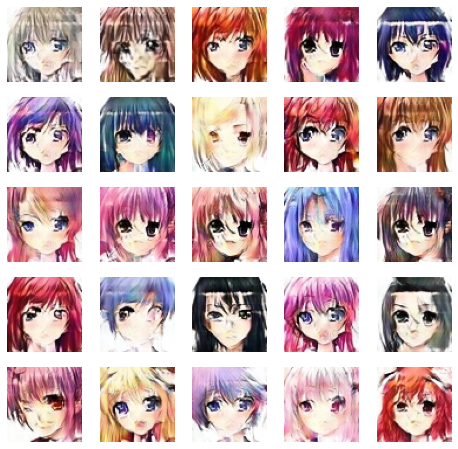

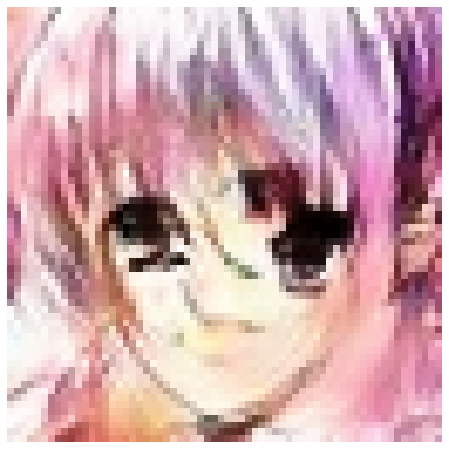

13200 [Discriminator loss: 0.327526, acc.: 87.80%] [Generator loss: 3.583754]
13400 [Discriminator loss: 0.181845, acc.: 94.06%] [Generator loss: 4.269242]
13600 [Discriminator loss: 0.136174, acc.: 95.75%] [Generator loss: 4.208754]
13800 [Discriminator loss: 0.111031, acc.: 97.37%] [Generator loss: 6.046177]
14000 [Discriminator loss: 0.144457, acc.: 95.45%] [Generator loss: 4.785809]


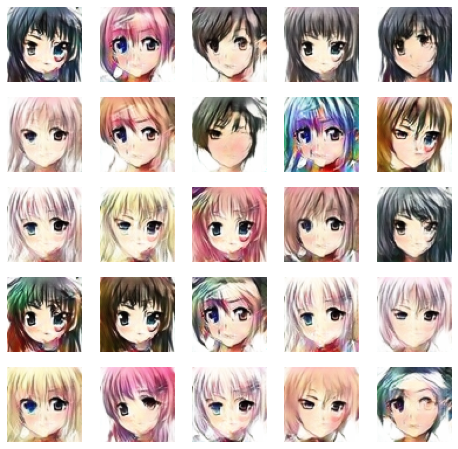

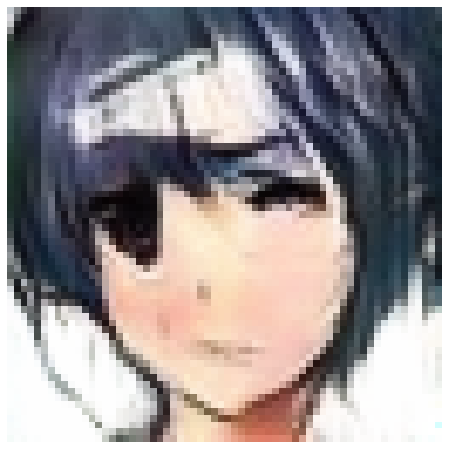

14200 [Discriminator loss: 0.163854, acc.: 94.44%] [Generator loss: 4.552796]
14400 [Discriminator loss: 0.132001, acc.: 95.41%] [Generator loss: 4.727169]
14600 [Discriminator loss: 0.180005, acc.: 94.28%] [Generator loss: 4.623919]
14800 [Discriminator loss: 0.267030, acc.: 89.71%] [Generator loss: 4.043165]
15000 [Discriminator loss: 0.173522, acc.: 93.95%] [Generator loss: 3.921513]


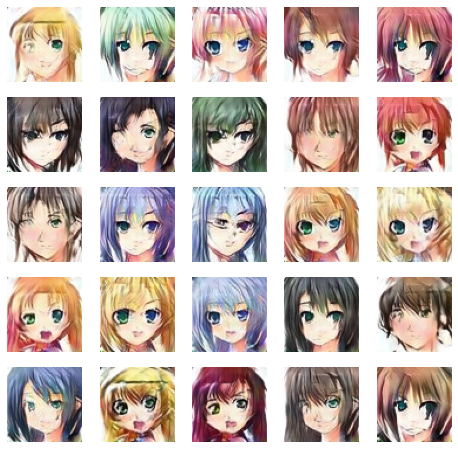

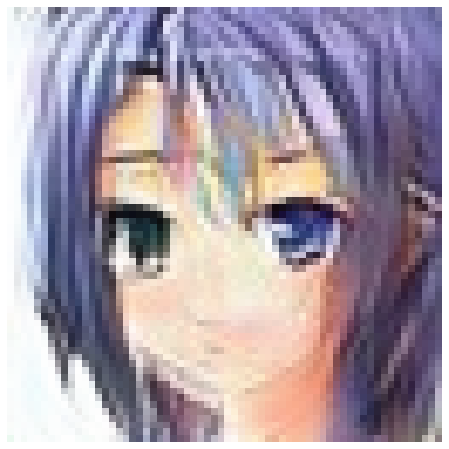

15200 [Discriminator loss: 0.229483, acc.: 91.38%] [Generator loss: 3.874789]
15400 [Discriminator loss: 0.193559, acc.: 93.33%] [Generator loss: 4.213798]
15600 [Discriminator loss: 0.185922, acc.: 93.26%] [Generator loss: 4.032624]
15800 [Discriminator loss: 0.227790, acc.: 91.95%] [Generator loss: 3.996980]
16000 [Discriminator loss: 0.244865, acc.: 90.58%] [Generator loss: 3.832111]


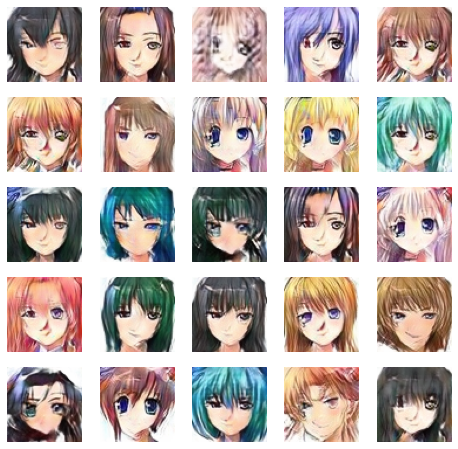

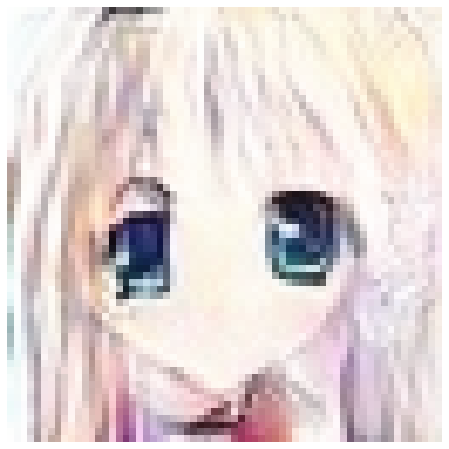

16200 [Discriminator loss: 0.154374, acc.: 94.71%] [Generator loss: 4.520013]
16400 [Discriminator loss: 0.147415, acc.: 95.05%] [Generator loss: 4.408362]
16600 [Discriminator loss: 0.224360, acc.: 91.64%] [Generator loss: 3.945596]
16800 [Discriminator loss: 0.198556, acc.: 92.96%] [Generator loss: 4.164787]
17000 [Discriminator loss: 0.290076, acc.: 88.73%] [Generator loss: 3.706883]


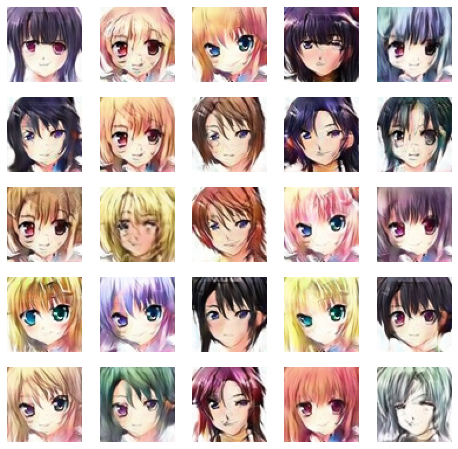

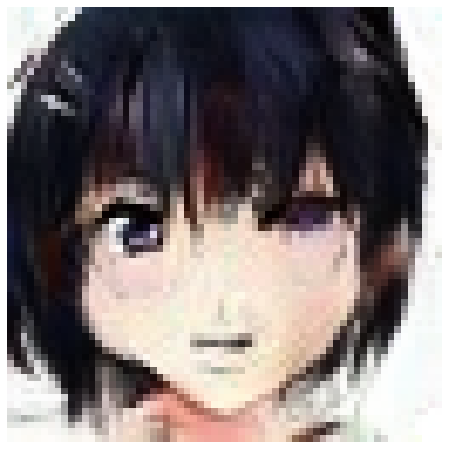

17200 [Discriminator loss: 0.202584, acc.: 92.68%] [Generator loss: 3.883618]
17400 [Discriminator loss: 0.137798, acc.: 95.25%] [Generator loss: 4.478030]
17600 [Discriminator loss: 0.222038, acc.: 92.61%] [Generator loss: 3.775187]
17800 [Discriminator loss: 0.145965, acc.: 95.12%] [Generator loss: 4.165440]
18000 [Discriminator loss: 0.213577, acc.: 92.47%] [Generator loss: 4.023884]


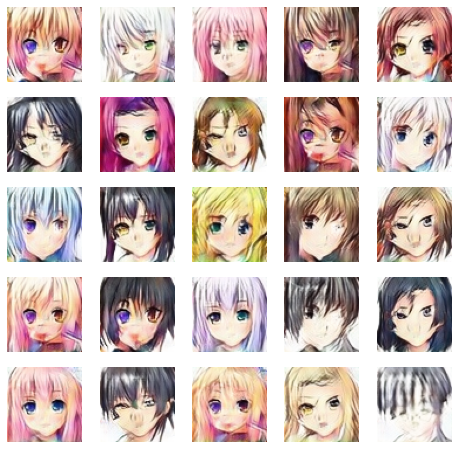

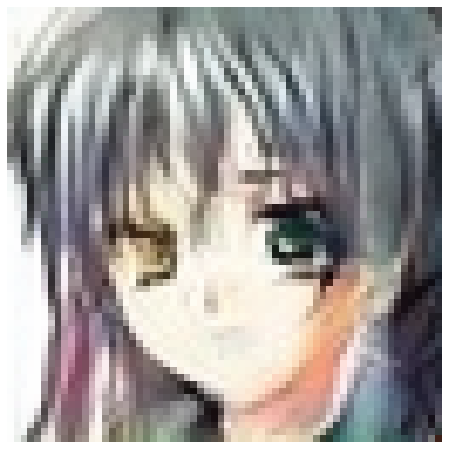

18200 [Discriminator loss: 0.136088, acc.: 96.09%] [Generator loss: 4.723526]
18400 [Discriminator loss: 0.132257, acc.: 95.58%] [Generator loss: 4.566930]
18600 [Discriminator loss: 0.258142, acc.: 90.40%] [Generator loss: 3.933159]
18800 [Discriminator loss: 0.169704, acc.: 94.36%] [Generator loss: 4.623834]
19000 [Discriminator loss: 0.185330, acc.: 93.68%] [Generator loss: 3.897647]


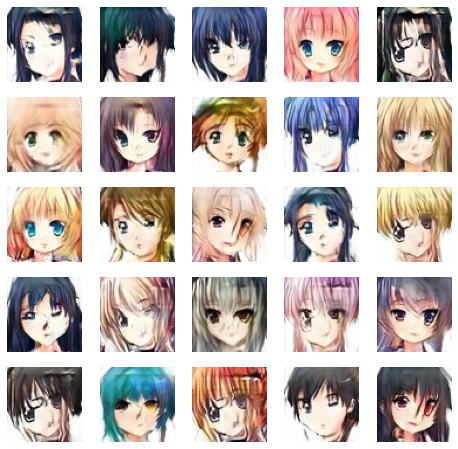

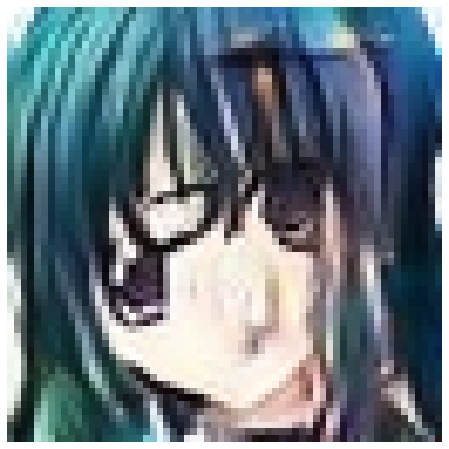

19200 [Discriminator loss: 0.230607, acc.: 90.85%] [Generator loss: 3.739002]
19400 [Discriminator loss: 0.164911, acc.: 94.34%] [Generator loss: 4.149137]
19600 [Discriminator loss: 0.178265, acc.: 93.85%] [Generator loss: 4.064204]
19800 [Discriminator loss: 0.121938, acc.: 95.79%] [Generator loss: 4.639828]
20000 [Discriminator loss: 0.122336, acc.: 95.78%] [Generator loss: 4.666108]


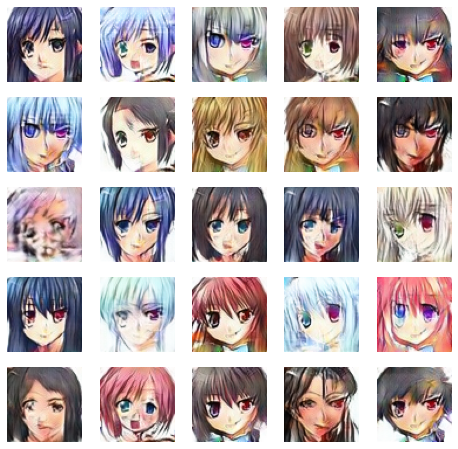

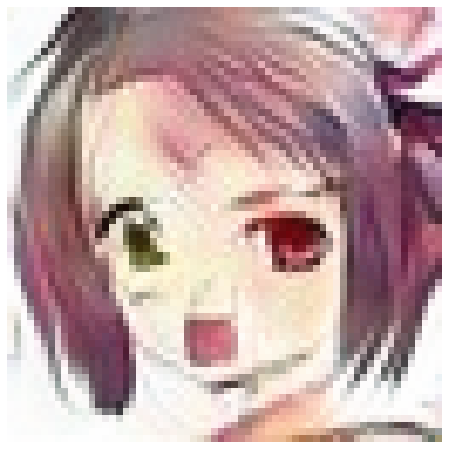

20200 [Discriminator loss: 0.176735, acc.: 94.45%] [Generator loss: 4.086581]
20400 [Discriminator loss: 0.204515, acc.: 92.36%] [Generator loss: 4.037364]
20600 [Discriminator loss: 0.214521, acc.: 92.38%] [Generator loss: 4.073648]
20800 [Discriminator loss: 0.171319, acc.: 94.15%] [Generator loss: 4.184357]
21000 [Discriminator loss: 0.154596, acc.: 95.21%] [Generator loss: 4.394989]


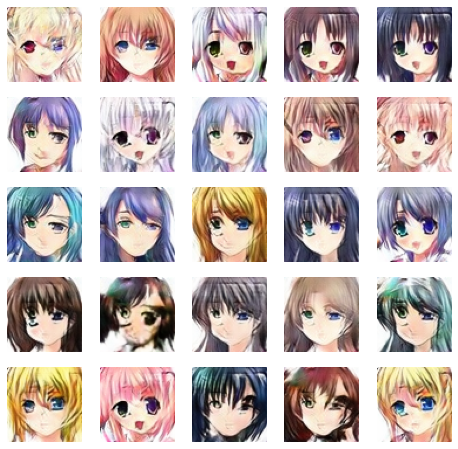

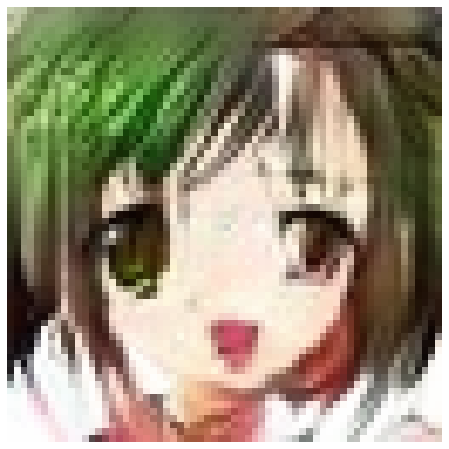

21200 [Discriminator loss: 0.175155, acc.: 93.82%] [Generator loss: 4.051382]
21400 [Discriminator loss: 0.163542, acc.: 94.96%] [Generator loss: 4.008413]
21600 [Discriminator loss: 0.108403, acc.: 96.54%] [Generator loss: 4.943296]
21800 [Discriminator loss: 0.189165, acc.: 93.16%] [Generator loss: 4.764654]
22000 [Discriminator loss: 0.141000, acc.: 95.32%] [Generator loss: 4.616421]


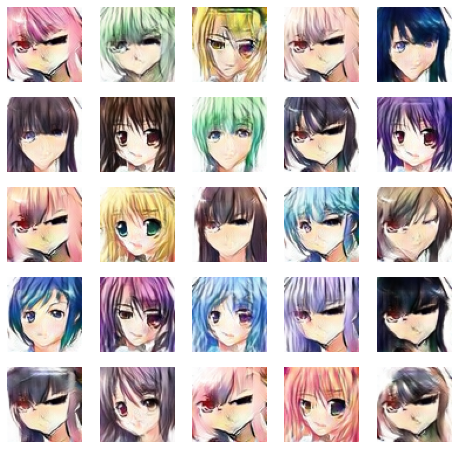

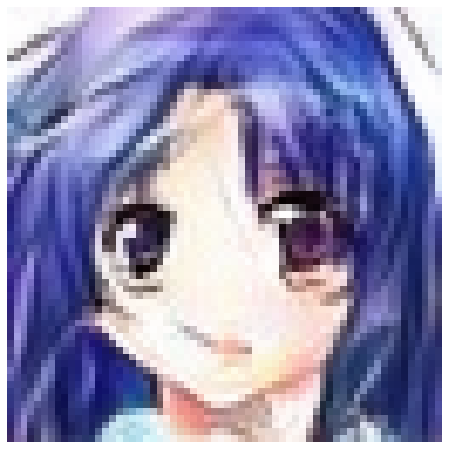

22200 [Discriminator loss: 0.151618, acc.: 95.21%] [Generator loss: 4.816493]
22400 [Discriminator loss: 0.129374, acc.: 95.77%] [Generator loss: 4.326659]
22600 [Discriminator loss: 0.268486, acc.: 88.94%] [Generator loss: 3.692372]
22800 [Discriminator loss: 0.241510, acc.: 90.74%] [Generator loss: 3.757184]
23000 [Discriminator loss: 0.173365, acc.: 93.90%] [Generator loss: 4.803355]


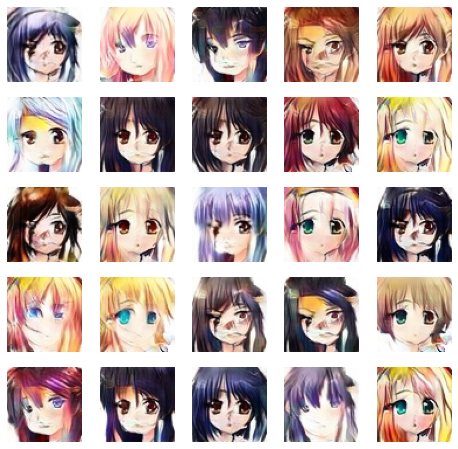

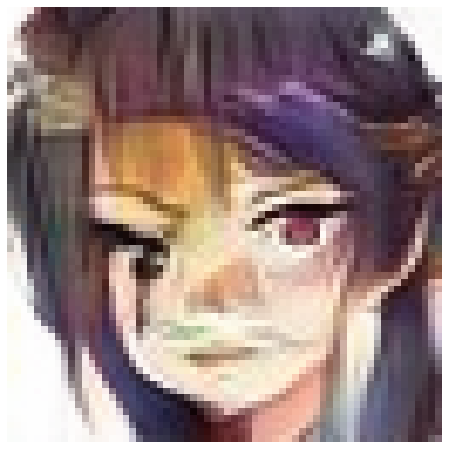

23200 [Discriminator loss: 0.172468, acc.: 93.57%] [Generator loss: 4.305079]
23400 [Discriminator loss: 0.130503, acc.: 95.60%] [Generator loss: 4.966626]
23600 [Discriminator loss: 0.068187, acc.: 98.14%] [Generator loss: 5.151347]
23800 [Discriminator loss: 0.084232, acc.: 97.69%] [Generator loss: 5.923566]
24000 [Discriminator loss: 0.079954, acc.: 97.41%] [Generator loss: 5.806639]


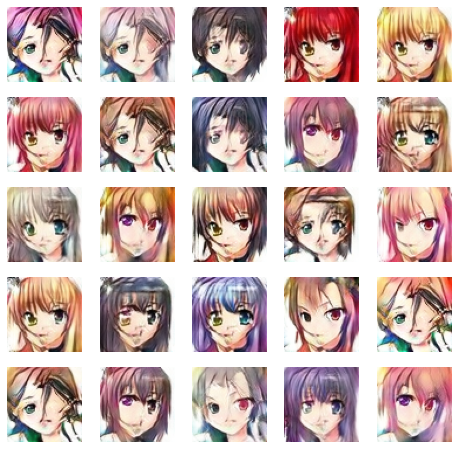

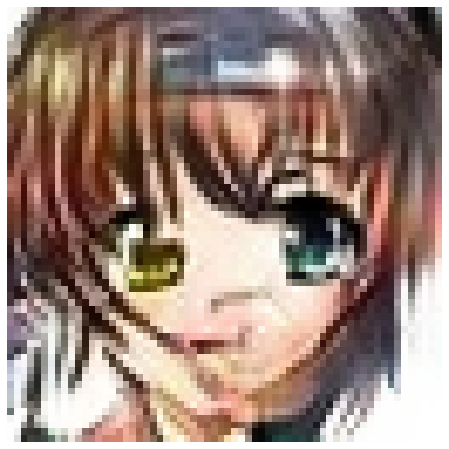

24200 [Discriminator loss: 0.092695, acc.: 97.09%] [Generator loss: 5.685001]
24400 [Discriminator loss: 0.112803, acc.: 96.49%] [Generator loss: 5.180372]
24600 [Discriminator loss: 0.101970, acc.: 97.00%] [Generator loss: 5.056379]
24800 [Discriminator loss: 0.146448, acc.: 95.07%] [Generator loss: 5.133594]
25000 [Discriminator loss: 0.109002, acc.: 96.62%] [Generator loss: 5.287721]


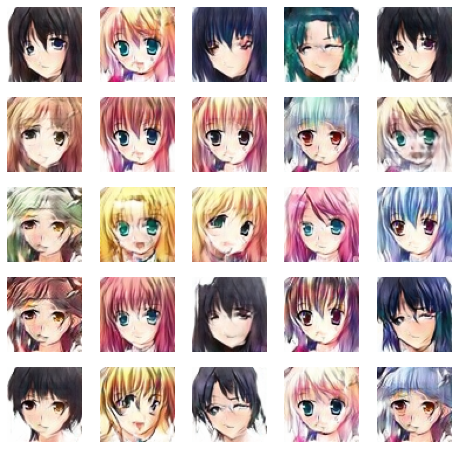

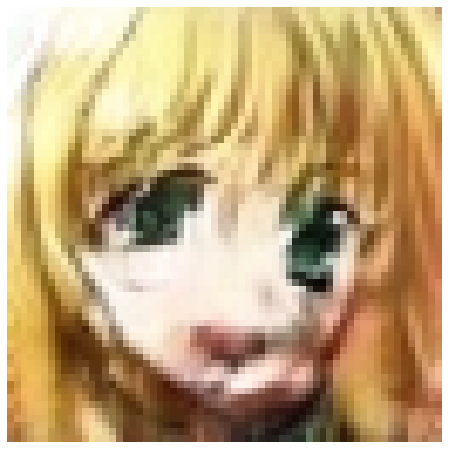

25200 [Discriminator loss: 0.102761, acc.: 96.87%] [Generator loss: 5.214011]
25400 [Discriminator loss: 0.185529, acc.: 94.27%] [Generator loss: 4.435278]
25600 [Discriminator loss: 0.110259, acc.: 96.42%] [Generator loss: 4.751547]
25800 [Discriminator loss: 0.104033, acc.: 96.68%] [Generator loss: 5.165607]
26000 [Discriminator loss: 0.121253, acc.: 96.18%] [Generator loss: 5.358483]


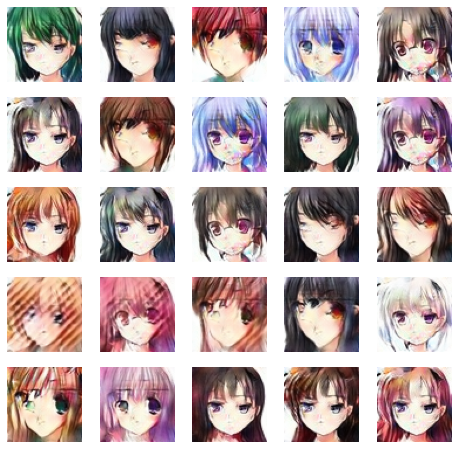

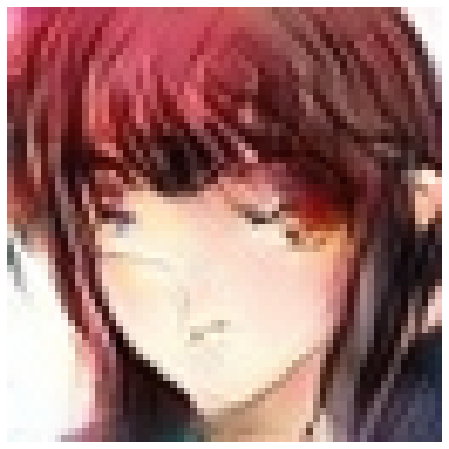

26200 [Discriminator loss: 0.139398, acc.: 95.62%] [Generator loss: 4.837502]
26400 [Discriminator loss: 0.104740, acc.: 96.59%] [Generator loss: 5.244529]
26600 [Discriminator loss: 0.154332, acc.: 95.13%] [Generator loss: 4.961258]
26800 [Discriminator loss: 0.089161, acc.: 97.32%] [Generator loss: 5.090659]
27000 [Discriminator loss: 0.110860, acc.: 96.74%] [Generator loss: 5.016080]


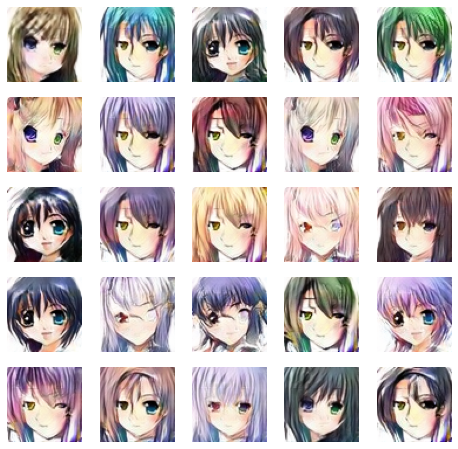

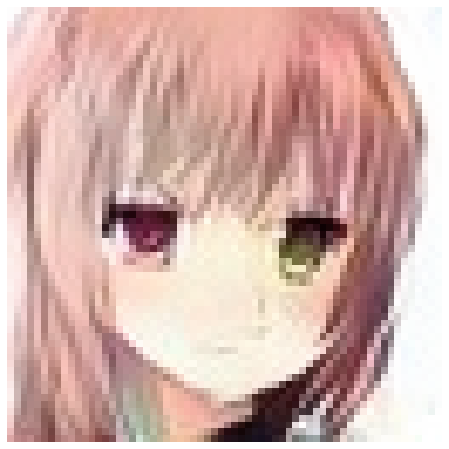

27200 [Discriminator loss: 0.206208, acc.: 93.88%] [Generator loss: 4.418383]
27400 [Discriminator loss: 0.156546, acc.: 95.06%] [Generator loss: 4.758216]
27600 [Discriminator loss: 0.114625, acc.: 96.65%] [Generator loss: 4.701371]
27800 [Discriminator loss: 0.158314, acc.: 95.15%] [Generator loss: 4.243442]
28000 [Discriminator loss: 0.108871, acc.: 96.34%] [Generator loss: 5.266521]


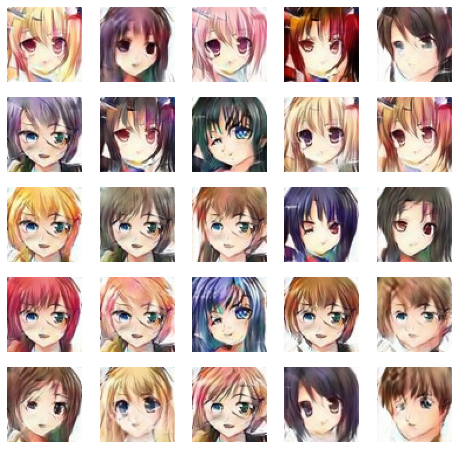

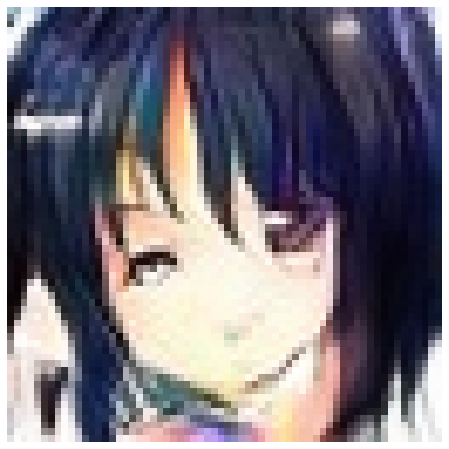

28200 [Discriminator loss: 0.180848, acc.: 94.04%] [Generator loss: 4.674906]
28400 [Discriminator loss: 0.106353, acc.: 96.27%] [Generator loss: 4.766340]
28600 [Discriminator loss: 0.129124, acc.: 95.59%] [Generator loss: 5.486124]
28800 [Discriminator loss: 0.103372, acc.: 96.57%] [Generator loss: 5.192315]
29000 [Discriminator loss: 0.100948, acc.: 96.40%] [Generator loss: 5.529681]


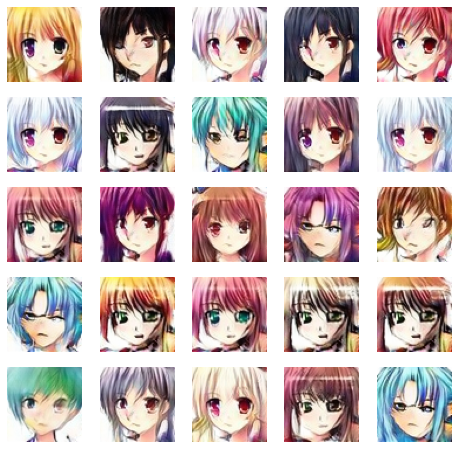

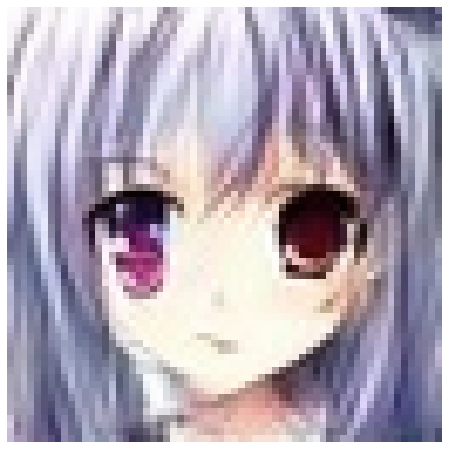

29200 [Discriminator loss: 0.129765, acc.: 95.97%] [Generator loss: 5.373046]
29400 [Discriminator loss: 0.121682, acc.: 96.33%] [Generator loss: 4.899807]
29600 [Discriminator loss: 0.119737, acc.: 96.38%] [Generator loss: 5.135644]
29800 [Discriminator loss: 0.111396, acc.: 96.53%] [Generator loss: 5.131769]
30000 [Discriminator loss: 0.150450, acc.: 95.37%] [Generator loss: 4.604301]


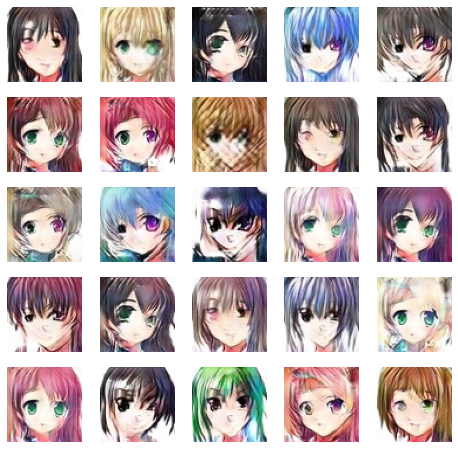

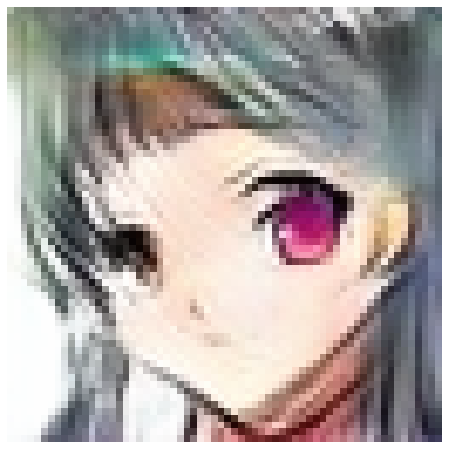

In [7]:
gan = GAN()
gan.train(epochs = 30001, batch_size = 256, metrics_update=200, save_images = 1000,
         save_model=15000)

# Image Reshape to 64x64 for Style Transfer

In [20]:
#Reshape for GAN outputs
inputpath = "E:\\deep_learning\\GAN\\humanface\\"
outputpath = "E:\\deep_learning\\GAN\\humanface\\"
item  = "one_face_30000.png"
dirs = os.listdir(inputpath)
if os.path.isfile(inputpath + item):
    im = Image.open(inputpath + item)
    f,e = os.path.split(input_path + item)
    imResize = im.resize((64,64), Image.ANTIALIAS)
    imResize.save(outputpath + e +" resized.png", "PNG", quality = 90)
    

In [1]:
from __future__ import print_function
from keras.preprocessing.image import load_img, img_to_array
from keras.preprocessing.image import save_img
import numpy as np
from scipy.optimize import fmin_l_bfgs_b
import time
import argparse

from keras.applications import vgg19
from keras import backend as K

Using TensorFlow backend.
C:\Users\CHEUNKE3\.conda\envs\AI_grp_pj\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\CHEUNKE3\.conda\envs\AI_grp_pj\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\CHEUNKE3\.conda\envs\AI_grp_pj\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\CHEUNKE3\.conda\envs\AI_gr

In [15]:
import os
import tensorflow as tf

os.environ['CUDA_VISIBLE_DEVICES'] = '-1'

tf.config.set_visible_devices([], 'GPU')

if tf.test.gpu_device_name():
    print('GPU found')
else:
    print("No GPU found")

AttributeError: module 'tensorflow._api.v1.config' has no attribute 'set_visible_devices'

In [13]:
tf.test.is_gpu_available()

True

# Style Transfer

In [20]:
from __future__ import print_function
from keras.preprocessing.image import load_img, img_to_array
from keras.preprocessing.image import save_img
import numpy as np
from scipy.optimize import fmin_l_bfgs_b
import time
import argparse

from keras.applications import vgg19
from keras import backend as K

#Specify image paths 
base_image_path = r"E:\deep_learning\ppl.jpeg"
style_reference_image_path = r"E:\deep_learning\bedroomrob.jpg"
result_prefix = r"E:\deep_learning\style_tran"

#Monitor the transfer process
iterations = 10

# The weights of Content image & Style image in outputs 
content_weight = 0.0025
style_weight = 5.0
# Total variation weight is default at 1.0
total_variation_weight = 1.0

# Specify the width and height of output 
width, height = load_img(base_image_path).size
img_nrows = 400
img_ncols = int(width * img_nrows / height)

# Preprocess image to VGG19 Format
def preprocess_image(image_path):
    img = load_img(image_path, target_size=(img_nrows, img_ncols))
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = vgg19.preprocess_input(img)
    return img

# Convert feature vectors back to image
def deprocess_image(x):
    if K.image_data_format() == 'channels_first':
        x = x.reshape((3, img_nrows, img_ncols))
        x = x.transpose((1, 2, 0))
    else:
        x = x.reshape((img_nrows, img_ncols, 3))
    #  Remove zero-center by mean pixel
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    # Convert 'BGR' to'RGB'
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    return x

# Set Keras base_image variable = content image vector
base_image = K.variable(preprocess_image(base_image_path))
# Set Keras style_reference_image variable = style image vector
style_reference_image = K.variable(preprocess_image(style_reference_image_path))

# Set initial value of output
if K.image_data_format() == 'channels_first':
    combination_image = K.placeholder((1, 3, img_nrows, img_ncols))
else:
    combination_image = K.placeholder((1, img_nrows, img_ncols, 3))

# Combine tensors of content, style and combined images 
input_tensor = K.concatenate([base_image,
                              style_reference_image,
                              combination_image], axis=0)

# Load VGG19, not include the top 3 layers 
model = vgg19.VGG19(input_tensor=input_tensor,
                    weights='imagenet', include_top=False)

# Get the symbolic outputs of each "key" layer (we gave them unique names).
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])

# Gram matrix for style loss calculation
def gram_matrix(x):
    if K.image_data_format() == 'channels_first':
        features = K.batch_flatten(x)
    else:
        features = K.batch_flatten(K.permute_dimensions(x, (2, 0, 1)))
    gram = K.dot(features, K.transpose(features))
    return gram

# Calculate Style loss 
def style_loss(style, combination):
    assert K.ndim(style) == 3
    assert K.ndim(combination) == 3
    S = gram_matrix(style)
    C = gram_matrix(combination)
    channels = 3
    size = img_nrows * img_ncols
    return K.sum(K.square(S - C)) / (4. * (channels ** 2) * (size ** 2))

# Calculate Content loss 
def content_loss(base, combination):
    return K.sum(K.square(combination - base))

# the 3rd loss function, total variation loss,
# designed to keep the generated image locally coherent


# Calculate total variation loss for smoothening the image 
def total_variation_loss(x):
    assert K.ndim(x) == 4
    if K.image_data_format() == 'channels_first':
        a = K.square(x[:, :, :img_nrows - 1, :img_ncols - 1] - x[:, :, 1:, :img_ncols - 1])
        b = K.square(x[:, :, :img_nrows - 1, :img_ncols - 1] - x[:, :, :img_nrows - 1, 1:])
    else:
        a = K.square(x[:, :img_nrows - 1, :img_ncols - 1, :] - x[:, 1:, :img_ncols - 1, :])
        b = K.square(x[:, :img_nrows - 1, :img_ncols - 1, :] - x[:, :img_nrows - 1, 1:, :])
    return K.sum(K.pow(a + b, 1.25))

# Combine content, style and total variation losses 
loss = K.variable(0.)
layer_features = outputs_dict['block5_conv2']
base_image_features = layer_features[0, :, :, :]
combination_features = layer_features[2, :, :, :]
loss += content_weight * content_loss(base_image_features,
                                      combination_features)

feature_layers = ['block1_conv1', 'block2_conv1',
                  'block3_conv1', 'block4_conv1',
                  'block5_conv1']
for layer_name in feature_layers:
    layer_features = outputs_dict[layer_name]
    style_reference_features = layer_features[1, :, :, :]
    combination_features = layer_features[2, :, :, :]
    sl = style_loss(style_reference_features, combination_features)
    loss += (style_weight / len(feature_layers)) * sl
loss += total_variation_weight * total_variation_loss(combination_image)

# Calculate gradients of outputs 
grads = K.gradients(loss, combination_image)

# Call Keras function API 
outputs = [loss]
if isinstance(grads, (list, tuple)):
    outputs += grads
else:
    outputs.append(grads)

f_outputs = K.function([combination_image], outputs)


# Perform gradient desent, evluate the model
def eval_loss_and_grads(x):
    if K.image_data_format() == 'channels_first':
        x = x.reshape((1, 3, img_nrows, img_ncols))
    else:
        x = x.reshape((1, img_nrows, img_ncols, 3))
    outs = f_outputs([x])
    loss_value = outs[0]
    if len(outs[1:]) == 1:
        grad_values = outs[1].flatten().astype('float64')
    else:
        grad_values = np.array(outs[1:]).flatten().astype('float64')
    return loss_value, grad_values


# This Evaluator class makes it possible
# To compute loss and gradients in one pass
# While retrieving them via two separate functions,
# "loss" and "grads". This is done because scipy.optimize
# Requires separate functions for loss and gradients,
# But computing them separately would be inefficient.
class Evaluator(object):
    def __init__(self):
        self.loss_value = None
        self.grads_values = None

    def loss(self, x):
        assert self.loss_value is None
        loss_value, grad_values = eval_loss_and_grads(x)
        self.loss_value = loss_value
        self.grad_values = grad_values
        return self.loss_value

    def grads(self, x):
        assert self.loss_value is not None
        grad_values = np.copy(self.grad_values)
        self.loss_value = None
        self.grad_values = None
        return grad_values

# Model evaluation 
evaluator = Evaluator()

# run scipy-based optimization (L-BFGS) over the pixels of the generated image
# so as to minimize the neural style loss
x = preprocess_image(base_image_path)

# Each iteration generate 1 image 
for i in range(iterations):
    print('Start of iteration', i)
    start_time = time.time()
    x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x.flatten(),
                                     fprime=evaluator.grads, maxfun=20)
    print('Current loss value:', min_val)
    # save the output of each iteration 
    img = deprocess_image(x.copy())
    fname = result_prefix + '_at_iteration_%d.png' % i
    save_img(fname, img)
    end_time = time.time()
    print('Image saved as', fname)
    print('Iteration %d completed in %ds' % (i, end_time - start_time))

Start of iteration 0
Current loss value: 11225373000.0
Image saved as E:\deep_learning\style_tran_at_iteration_0.png
Iteration 0 completed in 21s
Start of iteration 1
Current loss value: 7140653600.0
Image saved as E:\deep_learning\style_tran_at_iteration_1.png
Iteration 1 completed in 20s
Start of iteration 2
Current loss value: 6005155000.0
Image saved as E:\deep_learning\style_tran_at_iteration_2.png
Iteration 2 completed in 20s
Start of iteration 3
Current loss value: 5572194300.0
Image saved as E:\deep_learning\style_tran_at_iteration_3.png
Iteration 3 completed in 20s
Start of iteration 4
Current loss value: 5214945300.0
Image saved as E:\deep_learning\style_tran_at_iteration_4.png
Iteration 4 completed in 21s
Start of iteration 5
Current loss value: 5009113600.0
Image saved as E:\deep_learning\style_tran_at_iteration_5.png
Iteration 5 completed in 20s
Start of iteration 6
Current loss value: 4887598000.0
Image saved as E:\deep_learning\style_tran_at_iteration_6.png
Iteration 6 c

# Reference

In [8]:
#https://ithelp.ithome.com.tw/articles/10192738
#https://medium.com/@jakethevalencian/style-transfer-human-to-anime-faces-5464ec3ab8e
#https://www.kaggle.com/nassimyagoub/gan-anime-faces/comments